In [1]:
import pandas as pd
import numpy as np
import pandas_profiling
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

In [56]:
%matplotlib inline

In [57]:
pd.set_option('display.max_columns', None)  # при вызове .head будет показывать все колонки

In [4]:
data = pd.read_csv('train.csv')

### Знакомство с данными

In [5]:
data.shape  # size of dataframe

(15129, 21)

In [6]:
data.info()  # info

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15129 entries, 0 to 15128
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             15129 non-null  int64  
 1   date           15129 non-null  object 
 2   price          13763 non-null  float64
 3   bedrooms       13615 non-null  float64
 4   bathrooms      13616 non-null  float64
 5   sqft_living    13618 non-null  float64
 6   sqft_lot       13618 non-null  float64
 7   floors         14683 non-null  float64
 8   waterfront     14677 non-null  float64
 9   view           14695 non-null  float64
 10  condition      14656 non-null  float64
 11  grade          14666 non-null  float64
 12  sqft_above     13569 non-null  float64
 13  sqft_basement  14662 non-null  float64
 14  yr_built       14679 non-null  float64
 15  yr_renovated   14677 non-null  float64
 16  zipcode        14692 non-null  float64
 17  lat            14682 non-null  float64
 18  long  

Познакомимся с колонками в данных

    date: Date house was sold (Дата продажи участка)
    price: Price of the sold house (Цена продажи)
    bedrooms: Number of Bedrooms (Число спален)
    bathrooms: Number of bathrooms (Число ванных комнат)
    sqft_living: Square footage of the living space (жилая площадь)
    sqrt_lot: Square footage of the lot (общая площадь)
    floors: Total floors in the house (кол-во этажей в доме)
    waterfront: Whether the house is on a waterfront(1: yes, 0: no) (дом на набережной?)
    view: special view? (вид из окна)
    condition: Condition of the house (Состояние здания)
    grade: unknown 
    sqft_above: Square footage of house apart from basement (Площадь здания без подвала)
    sqft_basement: Square footage of the basement (Площадь подвала)
    yr_built: Built year (Год постройки)
    yr_renovated: Year when the house was renovated (Год реновации)
    zipcode: zipcode of the house (Индекс здания)
    lat: Latitude coordinate (Широта)
    long Longitude coordinate (Долгота)
    sqft_living15: Living room area in 2015(implies some renovations) (после реновации)
    sqrt_lot15: Lot area in 2015(implies some renovations) (после реновации)

In [7]:
data.head()  # first look

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,5561000190,20140502T000000,NaN,NaN,NaN,NaN,NaN,2.0,0.0,0.0,4.0,9.0,NaN,0.0,1977.0,0.0,98027.0,47.4635,-121.991,NaN,NaN
1,2207200675,20140502T000000,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,4.0,7.0,NaN,0.0,1956.0,0.0,98007.0,47.6022,-122.134,NaN,NaN
2,3390600010,20140502T000000,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,4.0,7.0,NaN,0.0,1955.0,0.0,98106.0,47.5334,-122.365,NaN,NaN
3,7525000080,20140502T000000,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,3.0,8.0,NaN,360.0,1980.0,0.0,98074.0,47.6267,-122.046,NaN,NaN
4,5072200040,20140502T000000,NaN,NaN,NaN,NaN,NaN,1.0,0.0,2.0,5.0,8.0,NaN,310.0,1957.0,0.0,98166.0,47.4419,-122.340,NaN,NaN


In [8]:
data.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

Приведем даты к соответствующему виду

In [501]:
data['date'] = pd.to_datetime(data['date'])

Разберемся с пропусками в начале

In [502]:
out = data.isna()['price'].cumsum()  

In [503]:
out[out == (out.index + 1)].tail(1) # если кумулятивная сумма будет равна индексу значит под ряд пропускиz

1011    1012
Name: price, dtype: int32

У нас первые 1011 строк пропущены можем предположить, что они не записывались (спрашиваем у бизнеса)

In [504]:
data = data.iloc[1012:]

In [505]:
data

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
1012,6378500230,2014-05-20,423000.0,40.0,1.75,1940.0,6909.0,1.0,0.0,0.0,4.0,7.0,970.0,970.0,1941.0,0.0,98133.0,47.7108,-122.352,1460.0,6906.0
1013,5104520150,2014-05-20,426000.0,4.0,2.50,2800.0,8494.0,2.0,0.0,0.0,3.0,8.0,2800.0,0.0,2004.0,0.0,98038.0,47.3521,-122.009,NaN,8494.0
1014,7702010030,2014-05-20,551000.0,3.0,2.50,2830.0,5802.0,2.0,0.0,0.0,3.0,9.0,28300.0,0.0,2001.0,0.0,98028.0,47.7605,-122.234,2500.0,5788.0
1015,7247000035,2014-05-20,210000.0,4.0,1.75,2180.0,28710.0,1.0,0.0,0.0,3.0,8.0,1180.0,1000.0,1950.0,0.0,98198.0,47.4050,-122.288,2180.0,28710.0
1016,8562790760,2014-05-20,785000.0,NaN,3.50,3070.0,4684.0,2.0,0.0,0.0,3.0,10.0,NaN,880.0,2009.0,0.0,98027.0,47.5316,-122.076,2290.0,2664.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15124,9528104286,2015-01-13,455000.0,2.0,1.50,10200.0,1146.0,3.0,0.0,0.0,3.0,7.0,1020.0,0.0,2001.0,0.0,98115.0,47.6774,-122.325,1138.0,1156.0
15125,8682261440,2015-01-13,NaN,2.0,1.75,15600.0,4500.0,1.0,0.0,0.0,3.0,8.0,1560.0,0.0,2004.0,0.0,98053.0,47.7128,-122.032,1860.0,4500.0
15126,2767700022,2015-01-13,500000.0,3.0,3.25,1520.0,1500.0,3.0,0.0,0.0,3.0,7.0,1520.0,0.0,2000.0,0.0,98107.0,47.6700,-122.389,1520.0,1323.0
15127,1939050110,2015-01-13,500000.0,3.0,2.25,1440.0,15661.0,1.0,0.0,0.0,3.0,8.0,1180.0,260.0,1988.0,0.0,98074.0,47.6225,-122.038,1440.0,13963.0


### Снова посмотрим на данные но без пропусков в начале и с отформатированными датами

In [506]:
data.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

### Посмотрим на распределение цен

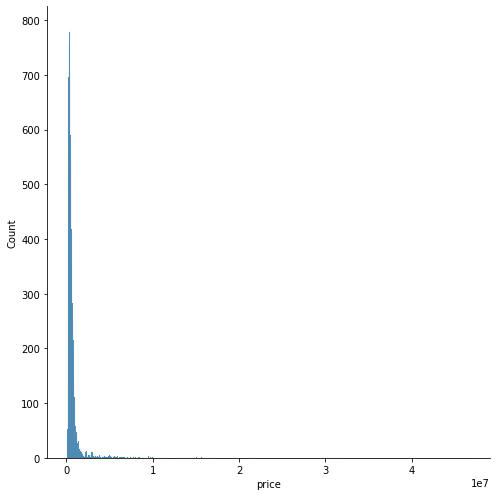

In [507]:
sns.displot(data, x='price', height=7)

In [508]:
data['price'] = np.log(data['price'])

C:\Users\HardWorkStation\AppData\Local\Temp\ipykernel_3456\4025759691.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



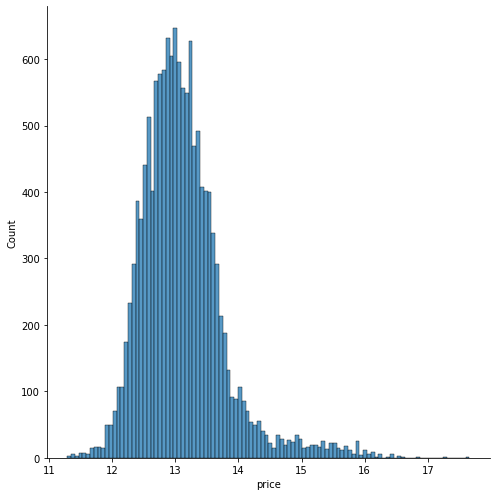

In [509]:
sns.displot(data, x='price', height=7)

<AxesSubplot:>

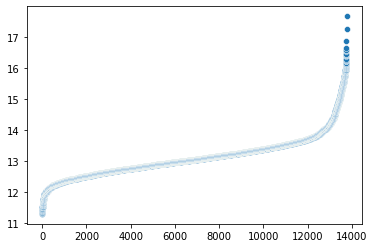

In [510]:
sns.scatterplot(x=range(len(data)), y=np.sort(data['price']))

Видим что данные распределены +- логнормально

In [511]:
data['price'].describe()

count    13763.000000
mean        13.113066
std          0.657628
min         11.289782
25%         12.691580
50%         13.031344
75%         13.415033
max         17.658826
Name: price, dtype: float64

### Рассмотрим распределение численных признаков

In [512]:
CONTINUES_COLS = [
    "price",
    "sqft_living",
    "sqft_lot",
    "sqft_above",
    "sqft_living15",
    "sqft_lot15"
]

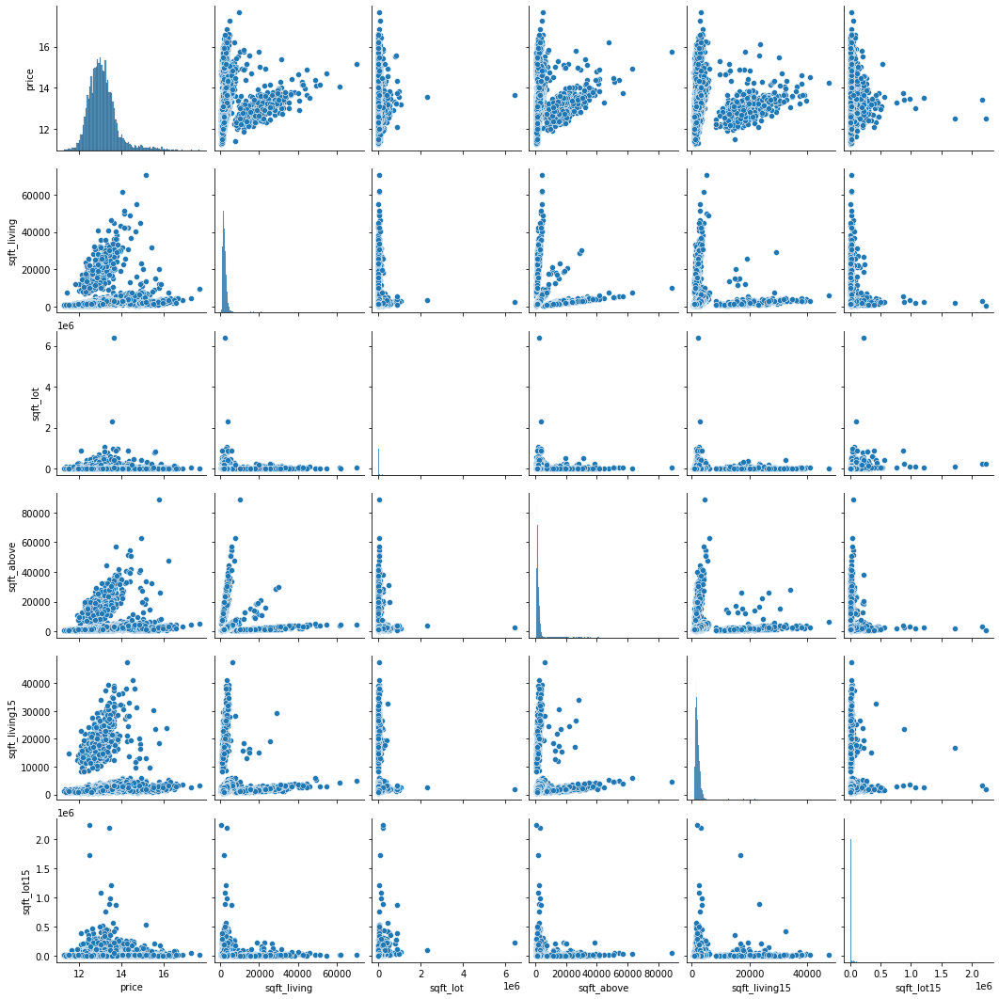

In [513]:
sns.pairplot(data[CONTINUES_COLS])

Кто видит странности? 

### Рассмотрим очевидную зависимость жилой площади и стоимости

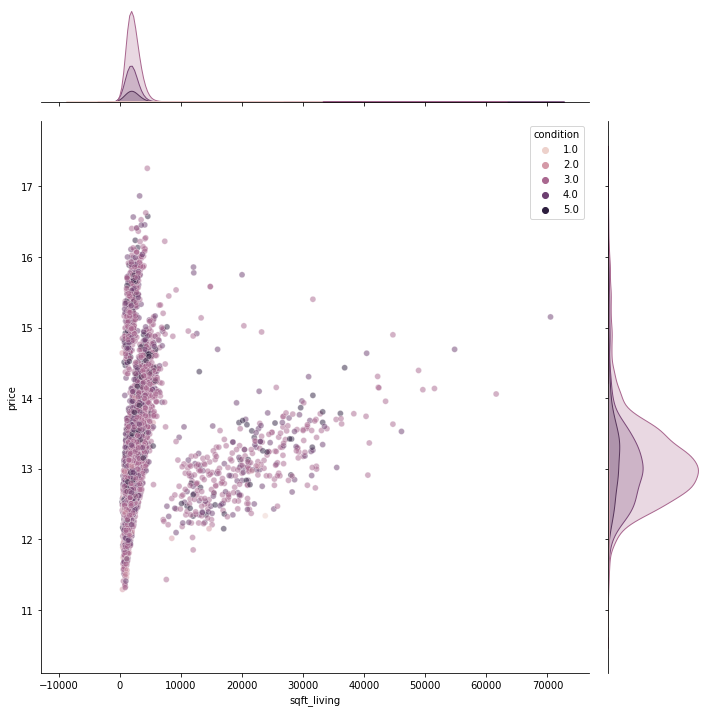

In [514]:
sns.jointplot(data=data, x='sqft_living', y='price', hue='condition', alpha = 0.5, height=10)

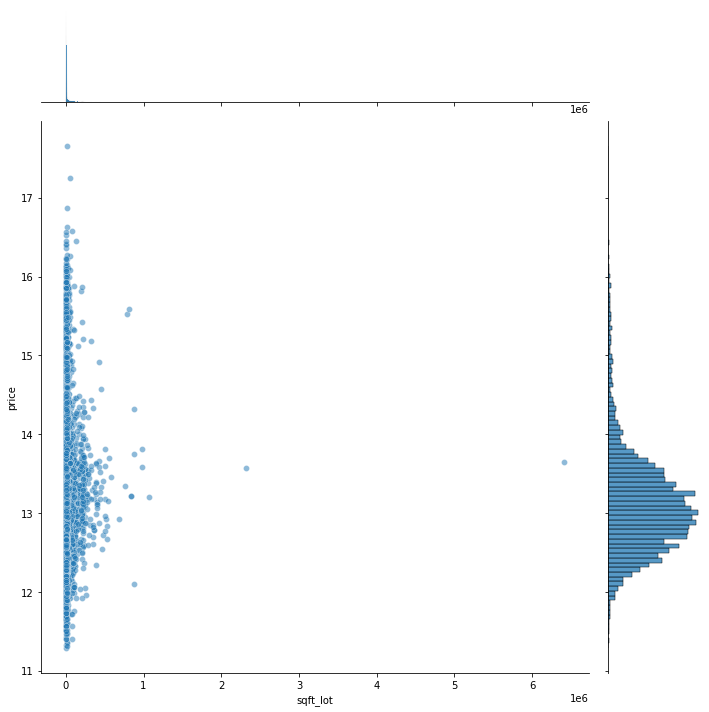

In [515]:
sns.jointplot(data=data, x='sqft_lot', y='price', alpha = 0.5, height=10)

Можем увидеть несколько кластеров для которых свойственен свой наклон линейной зависимости

### Посмотрим на распределения внутри категорий

Condition

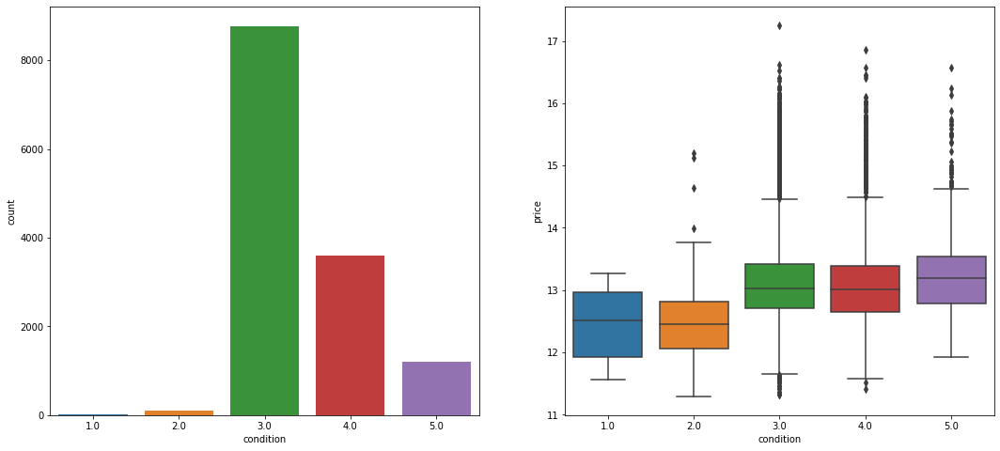

In [516]:
fig, ax = plt.subplots(ncols=2, figsize=(18,8))
sns.countplot(x='condition', data=data, ax=ax[0])
sns.boxplot(x='condition', y= 'price',
            data=data, ax=ax[1])
plt.show()

<Figure size 864x576 with 0 Axes>

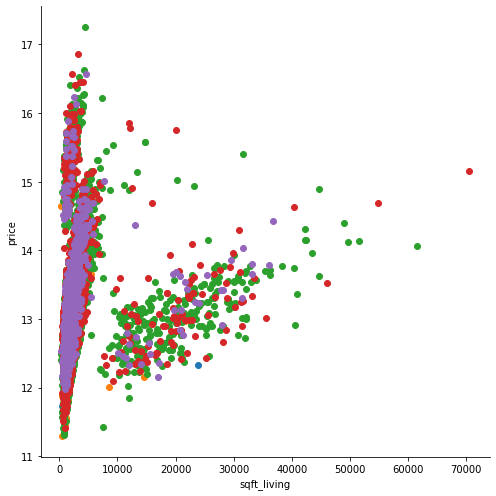

In [517]:
plt.figure(figsize = (12,8))
g = sns.FacetGrid(data=data, hue='condition', height=7)
g.map(plt.scatter, "sqft_living", "price")
plt.show()

Bedrooms

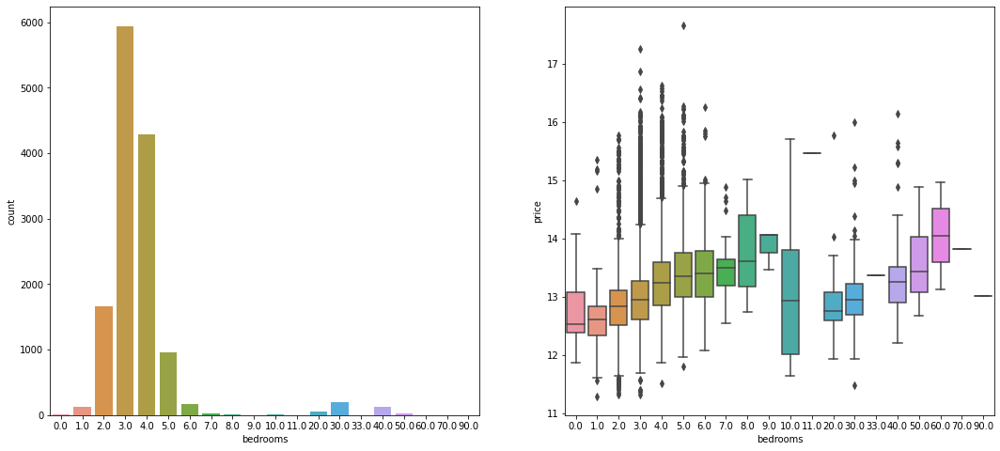

In [518]:
fig, ax = plt.subplots(ncols=2, figsize=(18,8))
sns.countplot(x='bedrooms', data=data, ax=ax[0])
sns.boxplot(x='bedrooms', y= 'price',
            data=data, ax=ax[1])
plt.show()

In [519]:
data

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
1012,6378500230,2014-05-20,12.955127,40.0,1.75,1940.0,6909.0,1.0,0.0,0.0,4.0,7.0,970.0,970.0,1941.0,0.0,98133.0,47.7108,-122.352,1460.0,6906.0
1013,5104520150,2014-05-20,12.962195,4.0,2.50,2800.0,8494.0,2.0,0.0,0.0,3.0,8.0,2800.0,0.0,2004.0,0.0,98038.0,47.3521,-122.009,NaN,8494.0
1014,7702010030,2014-05-20,13.219490,3.0,2.50,2830.0,5802.0,2.0,0.0,0.0,3.0,9.0,28300.0,0.0,2001.0,0.0,98028.0,47.7605,-122.234,2500.0,5788.0
1015,7247000035,2014-05-20,12.254863,4.0,1.75,2180.0,28710.0,1.0,0.0,0.0,3.0,8.0,1180.0,1000.0,1950.0,0.0,98198.0,47.4050,-122.288,2180.0,28710.0
1016,8562790760,2014-05-20,13.573439,NaN,3.50,3070.0,4684.0,2.0,0.0,0.0,3.0,10.0,NaN,880.0,2009.0,0.0,98027.0,47.5316,-122.076,2290.0,2664.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15124,9528104286,2015-01-13,13.028053,2.0,1.50,10200.0,1146.0,3.0,0.0,0.0,3.0,7.0,1020.0,0.0,2001.0,0.0,98115.0,47.6774,-122.325,1138.0,1156.0
15125,8682261440,2015-01-13,NaN,2.0,1.75,15600.0,4500.0,1.0,0.0,0.0,3.0,8.0,1560.0,0.0,2004.0,0.0,98053.0,47.7128,-122.032,1860.0,4500.0
15126,2767700022,2015-01-13,13.122363,3.0,3.25,1520.0,1500.0,3.0,0.0,0.0,3.0,7.0,1520.0,0.0,2000.0,0.0,98107.0,47.6700,-122.389,1520.0,1323.0
15127,1939050110,2015-01-13,13.122363,3.0,2.25,1440.0,15661.0,1.0,0.0,0.0,3.0,8.0,1180.0,260.0,1988.0,0.0,98074.0,47.6225,-122.038,1440.0,13963.0


In [520]:
data.loc[data['bedrooms'] == 0] = 1

C:\Users\HardWorkStation\AppData\Local\Temp\ipykernel_3456\1694608259.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [521]:
data['sqft_per_bedroom'] = (data['sqft_living'] / data['bedrooms'].fillna(1))

C:\Users\HardWorkStation\AppData\Local\Temp\ipykernel_3456\2049653802.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<AxesSubplot:>

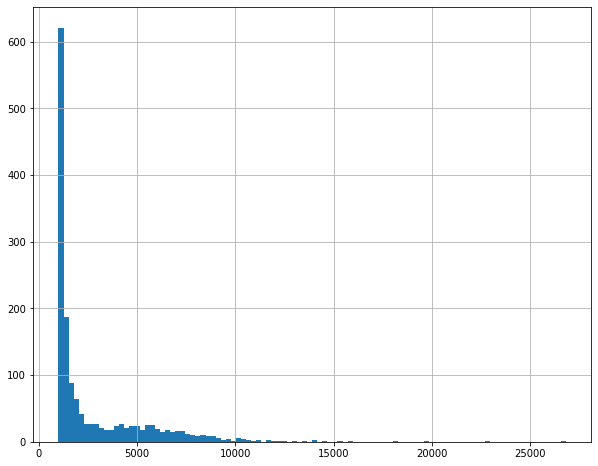

In [522]:
plt.figure(figsize=(10, 8))
data[data['sqft_per_bedroom'] > 1000]['sqft_per_bedroom'].hist(bins=100)

<AxesSubplot:>

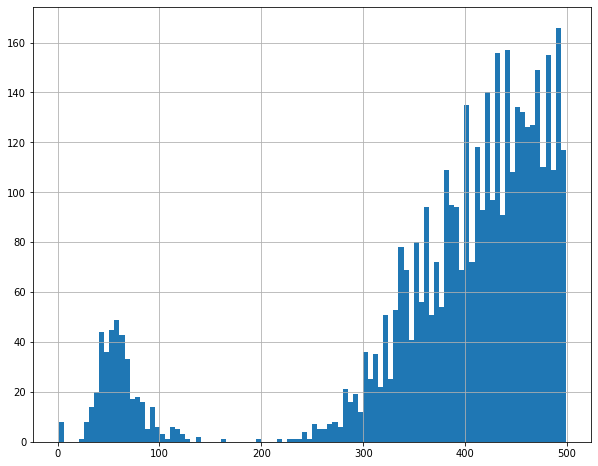

In [523]:
plt.figure(figsize=(10, 8))
data[data['sqft_per_bedroom'] < 500]['sqft_per_bedroom'].hist(bins=100)

In [524]:
(data['sqft_per_bedroom'] < 200).sum()

399

In [525]:
data = data[data['sqft_per_bedroom'] > 200]

In [526]:
data = data[data['bedrooms'] < 9]

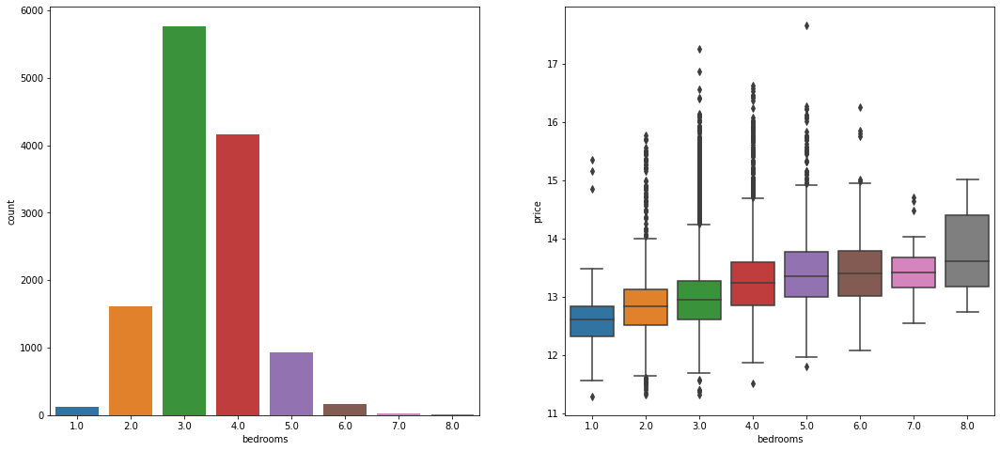

In [527]:
fig, ax = plt.subplots(ncols=2, figsize=(18,8))
sns.countplot(x='bedrooms', data=data, ax=ax[0])
sns.boxplot(x='bedrooms', y= 'price',
            data=data, ax=ax[1])
plt.show()

<Figure size 864x576 with 0 Axes>

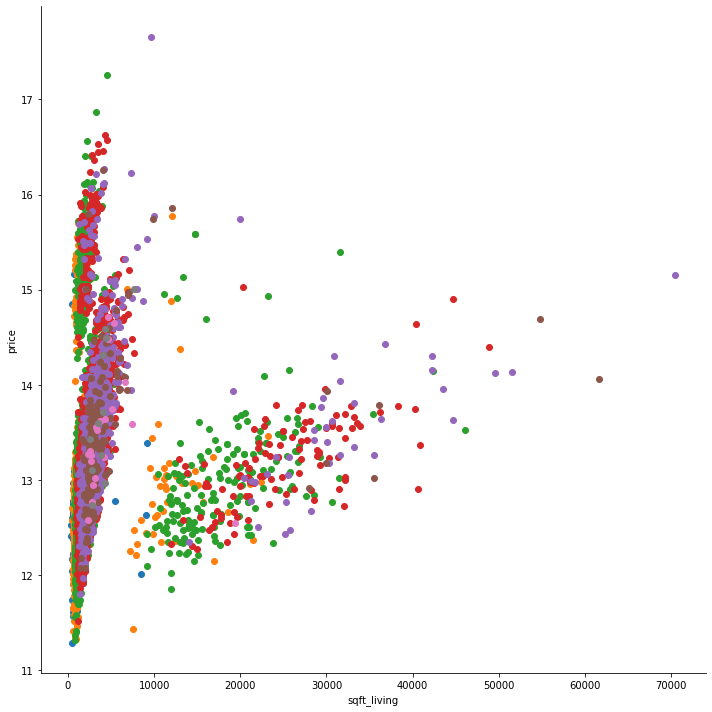

In [528]:
plt.figure(figsize = (12,8))
g = sns.FacetGrid(data=data, hue='bedrooms', height=10)
g.map(plt.scatter, "sqft_living", "price")
plt.show()

View

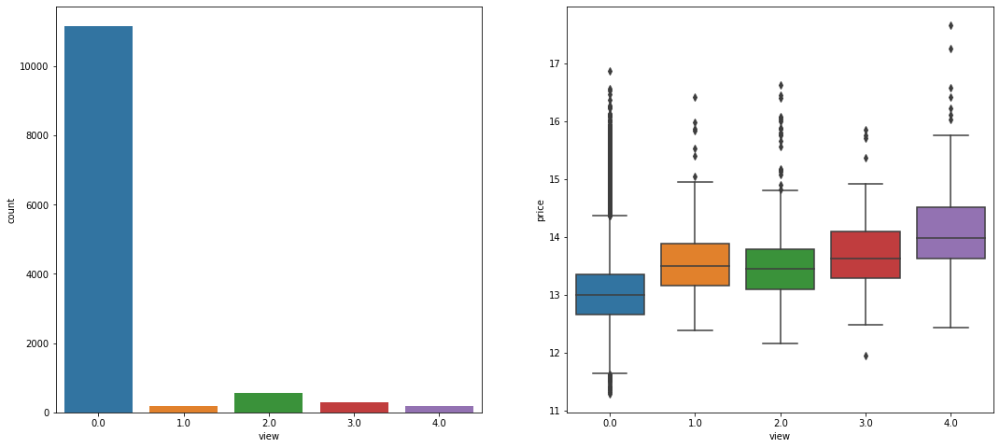

In [529]:
fig, ax = plt.subplots(ncols=2, figsize=(18,8))
sns.countplot(x='view', data=data, ax=ax[0])
sns.boxplot(x='view', y= 'price',
            data=data, ax=ax[1])
plt.show()

<Figure size 864x576 with 0 Axes>

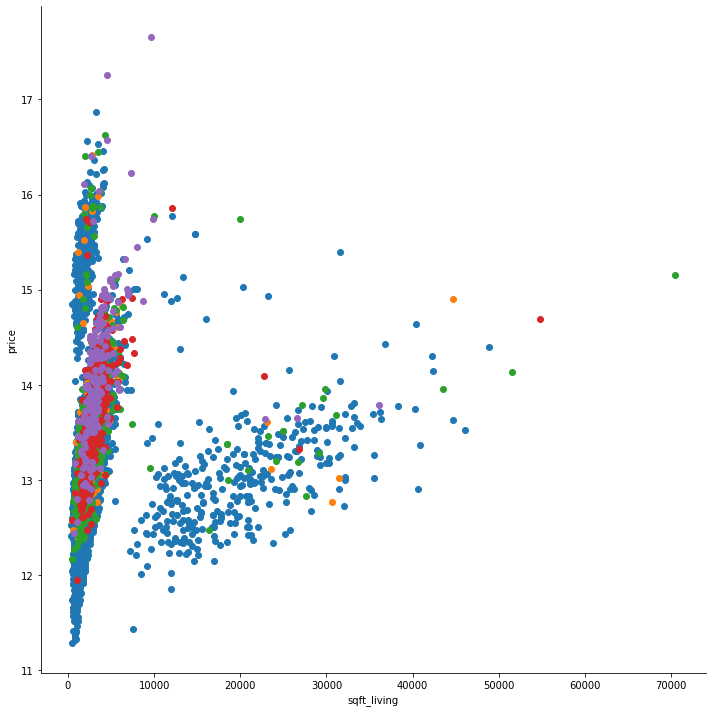

In [530]:
plt.figure(figsize = (12,8))
g = sns.FacetGrid(data=data, hue='view', height=10)
g.map(plt.scatter, "sqft_living", "price")
plt.show()

Bathrooms

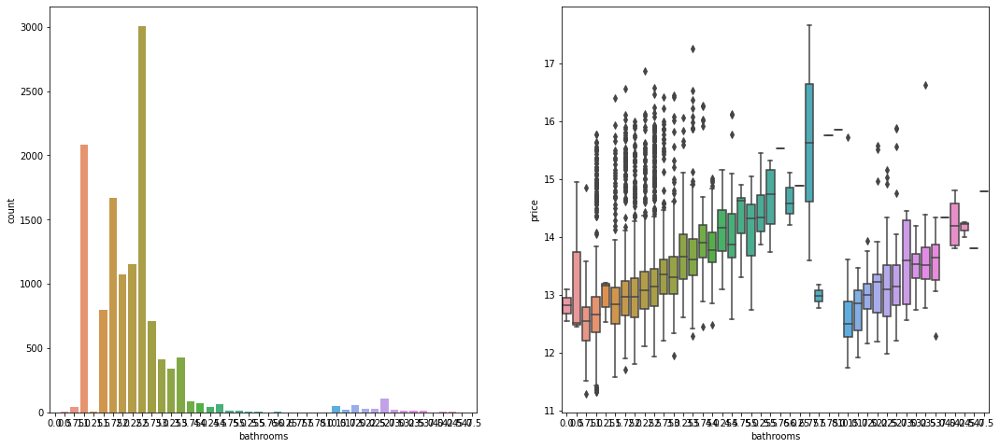

In [531]:
fig, ax = plt.subplots(ncols=2, figsize=(18,8))
sns.countplot(x='bathrooms', data=data, ax=ax[0])
sns.boxplot(x='bathrooms', y= 'price',
            data=data, ax=ax[1])
plt.show()

<Figure size 864x576 with 0 Axes>

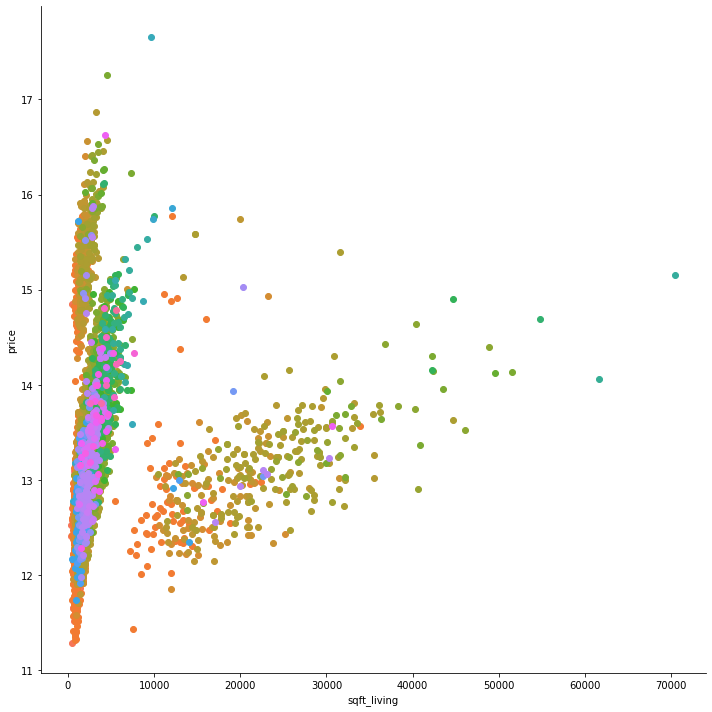

In [532]:
plt.figure(figsize = (12,8))
g = sns.FacetGrid(data=data, hue='bathrooms', height=10)
g.map(plt.scatter, "sqft_living", "price")
plt.show()

In [533]:
data.loc[data['bathrooms'] == 0, 'bathrooms'] = 1

In [534]:
(data['bathrooms'] == 0).sum()

0

In [535]:
data['sqft_per_bedroom'] = (data['sqft_living'] / data['bathrooms'].fillna(1))

<AxesSubplot:>

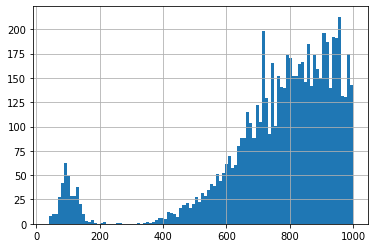

In [536]:
data[data['sqft_per_bedroom'] < 1000]['sqft_per_bedroom'].hist(bins=100)

In [537]:
data = data[data['sqft_per_bedroom'] > 300]

<AxesSubplot:>

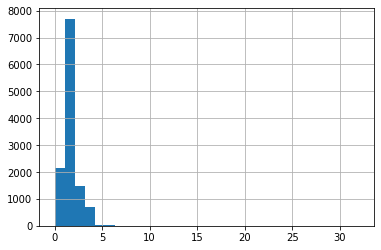

In [538]:
data['bathrooms'].round().hist(bins=30)

In [539]:
len(data[data['bathrooms'] > 7])

15

In [540]:
data = data[data['bathrooms'] < 7]

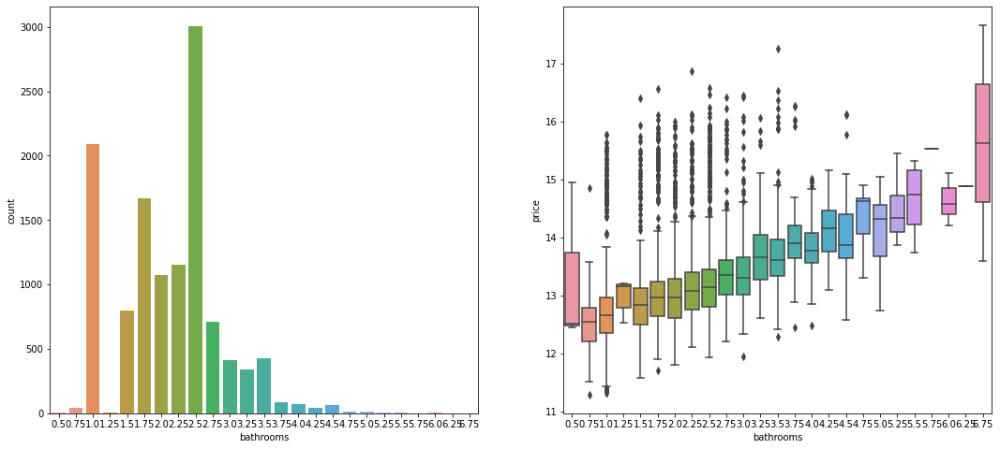

In [541]:
fig, ax = plt.subplots(ncols=2, figsize=(18,8))
sns.countplot(x='bathrooms', data=data, ax=ax[0])
sns.boxplot(x='bathrooms', y= 'price',
            data=data, ax=ax[1])
plt.show()

<Figure size 864x576 with 0 Axes>

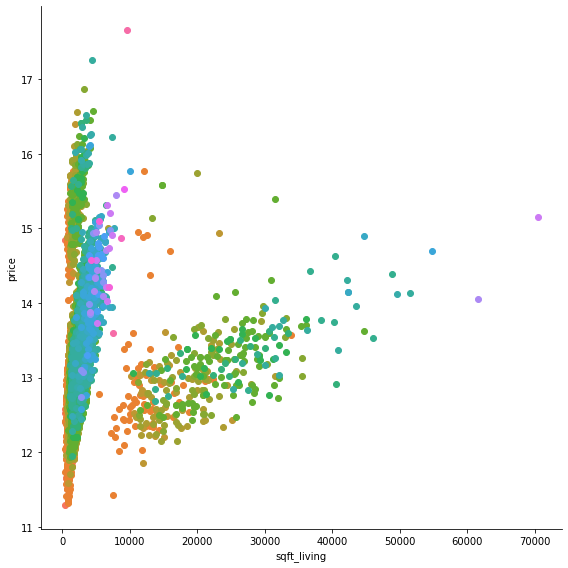

In [542]:
plt.figure(figsize = (12,8))
g = sns.FacetGrid(data=data, hue='bathrooms', height=8)
g.map(plt.scatter, "sqft_living", "price")
plt.show()

Floor

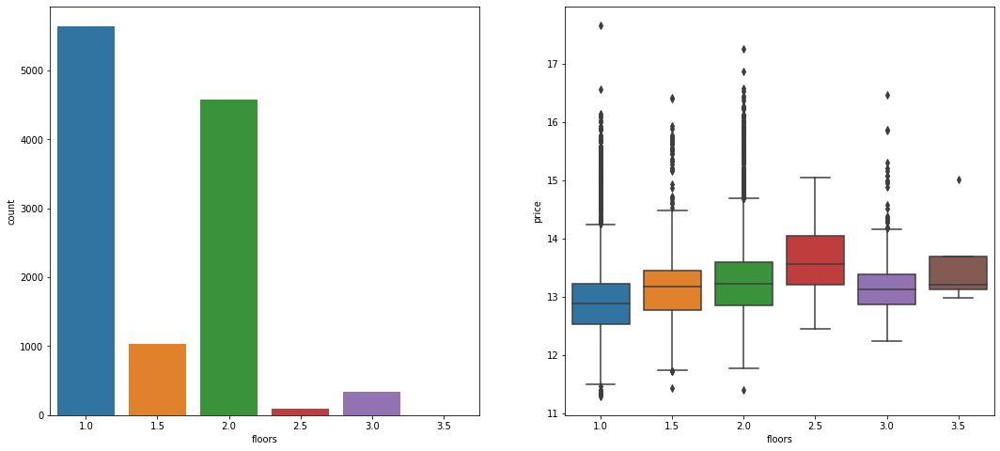

In [543]:
fig, ax = plt.subplots(ncols=2, figsize=(18,8))
sns.countplot(x='floors', data=data, ax=ax[0])
sns.boxplot(x='floors', y= 'price',
            data=data, ax=ax[1])
plt.show()

<Figure size 864x576 with 0 Axes>

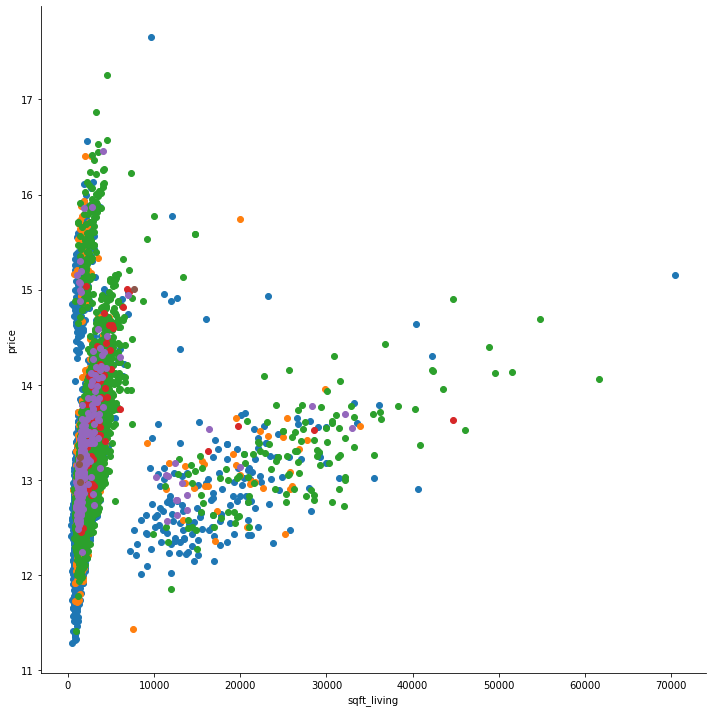

In [544]:
plt.figure(figsize = (12,8))
g = sns.FacetGrid(data=data, hue='floors', height=10)
g.map(plt.scatter, "sqft_living", "price")
plt.show()

Grade

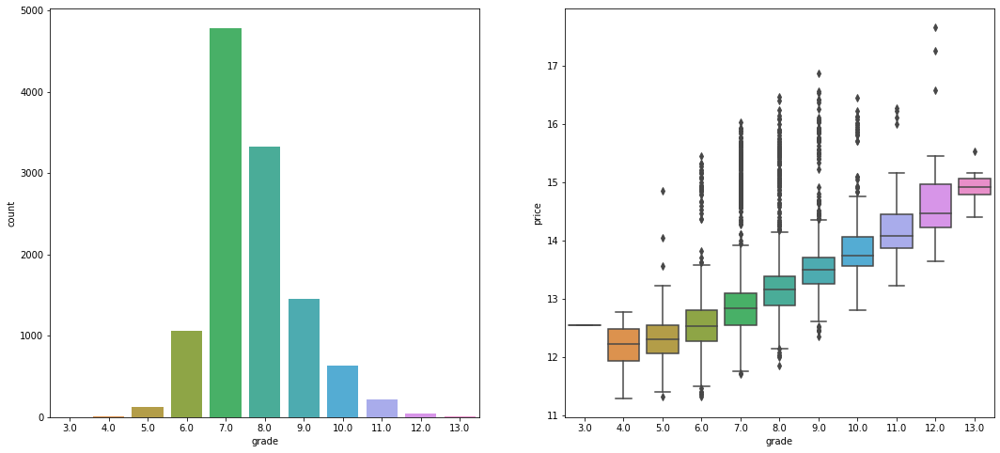

In [545]:
fig, ax = plt.subplots(ncols=2, figsize=(18,8))
sns.countplot(x='grade', data=data, ax=ax[0])
sns.boxplot(x='grade', y= 'price',
            data=data, ax=ax[1])
plt.show()

<Figure size 864x576 with 0 Axes>

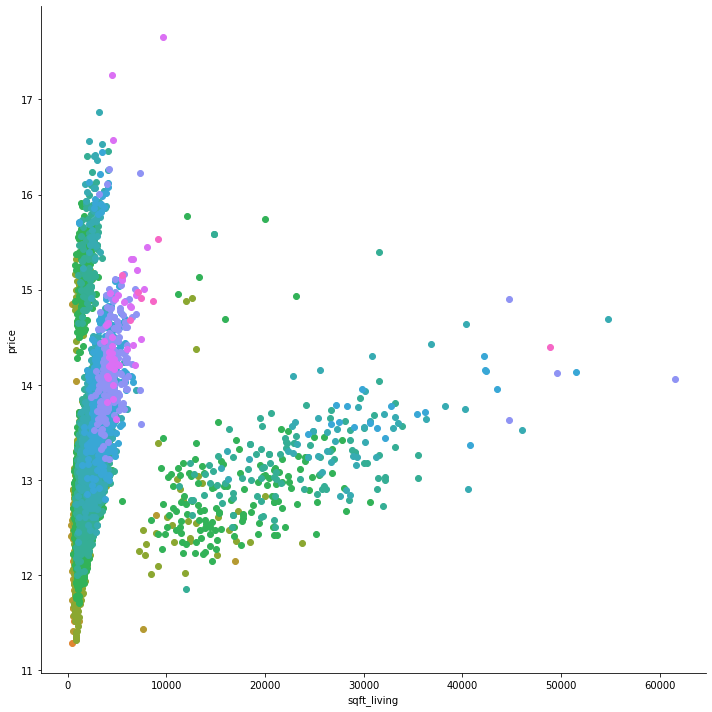

In [546]:
plt.figure(figsize = (12,8))
g = sns.FacetGrid(data=data, hue='grade', height=10)
g.map(plt.scatter, "sqft_living", "price")
plt.show()

In [547]:
data['sqft_living'] = np.log(data['sqft_living'])

<AxesSubplot:xlabel='sqft_living', ylabel='Count'>

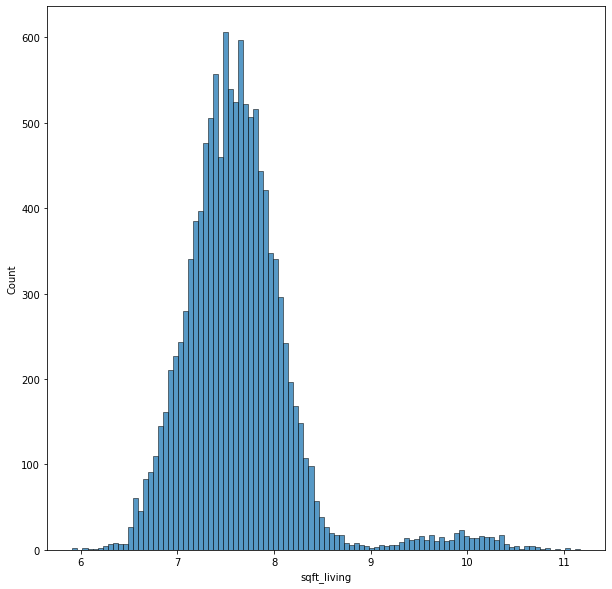

In [548]:
plt.figure(figsize=(10, 10))
sns.histplot(data, x='sqft_living',)

In [549]:
len(data[data['sqft_living'] > 9])

359

In [550]:
data = data[data['sqft_living'] < 9]

<Figure size 864x576 with 0 Axes>

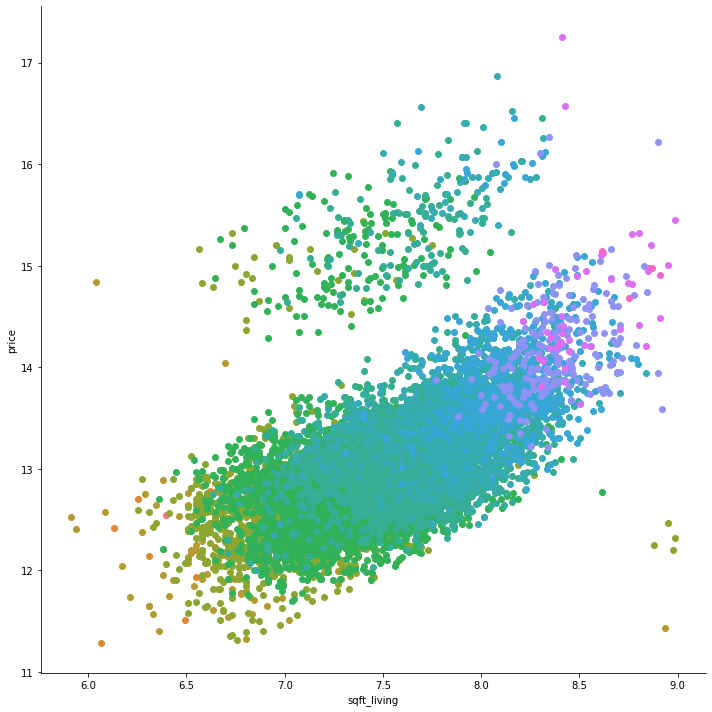

In [551]:
plt.figure(figsize = (12,8))
g = sns.FacetGrid(data=data, hue='grade', height=10)
g.map(plt.scatter, "sqft_living", "price")
plt.show()

<AxesSubplot:xlabel='price', ylabel='Count'>

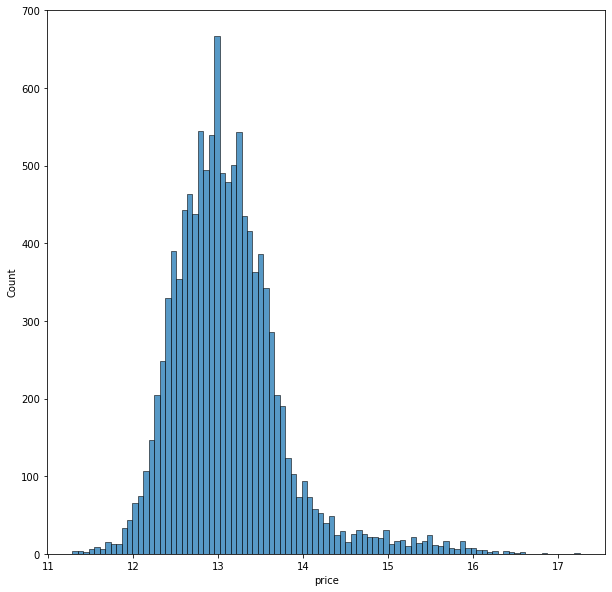

In [552]:
plt.figure(figsize=(10, 10))
sns.histplot(data, x='price',)

### Корреляции в категориях

In [553]:
bath = ['bathrooms', 'bedrooms']
cm = sns.light_palette("green", as_cmap=True)
pd.crosstab(data[bath[0]], data[bath[1]]).style.background_gradient(cmap = cm)

bedrooms,1.000000,2.000000,3.000000,4.000000,5.000000,6.000000,7.000000,8.000000
bathrooms,,,,,,,,
0.500000,1,1,0,1,0,0,0,0
0.750000,11,19,8,2,0,0,0,0
1.000000,81,822,927,171,22,3,1,0
1.250000,1,2,2,0,0,0,0,0
1.500000,8,161,450,129,26,5,1,0
1.750000,3,170,1000,384,64,7,0,0
2.000000,3,117,572,271,58,11,0,0
2.250000,1,65,590,390,60,6,2,0
2.500000,1,113,1267,1384,144,16,1,0


In [554]:
bath_cond = ['bathrooms', 'condition']
cm = sns.light_palette("green", as_cmap=True)
pd.crosstab(data[bath_cond[0]], data[bath_cond[1]]).style.background_gradient(cmap = cm)

condition,1.000000,2.000000,3.000000,4.000000,5.000000
bathrooms,,,,,
0.500000,0,0,2,1,0
0.750000,0,3,18,12,6
1.000000,10,42,1094,648,179
1.250000,0,0,3,2,0
1.500000,3,7,433,257,55
1.750000,0,10,745,632,191
2.000000,2,7,553,274,166
2.250000,0,2,654,347,75
2.500000,0,4,2272,437,131


In [555]:
bed_cond = ['bedrooms', 'condition']
cm = sns.light_palette("green", as_cmap=True)
pd.crosstab(data[bed_cond[0]], data[bed_cond[1]]).style.background_gradient(cmap = cm)

condition,1.000000,2.000000,3.000000,4.000000,5.000000
bedrooms,,,,,
1.000000,3,4,71,25,6
2.000000,4,24,900,395,125
3.000000,4,33,3273,1374,437
4.000000,3,15,2397,919,335
5.000000,0,1,529,199,79
6.000000,1,0,77,47,12
7.000000,0,0,12,4,2
8.000000,0,0,6,2,2


In [556]:
cond_water = ['condition', 'waterfront']
cm = sns.light_palette("green", as_cmap=True)
pd.crosstab(data[cond_water[0]], data[cond_water[1]]).style.background_gradient(cmap = cm)

waterfront,0.000000,1.000000
condition,,
1.000000,15,0
2.000000,77,0
3.000000,6997,49
4.000000,2837,28
5.000000,964,10


In [557]:
grade_cond = ['grade', 'condition']
cm = sns.light_palette("green", as_cmap=True)
pd.crosstab(data[grade_cond[0]], data[grade_cond[1]]).style.background_gradient(cmap = cm)

condition,1.000000,2.000000,3.000000,4.000000,5.000000
grade,,,,,
3.000000,0,1,0,0,0
4.000000,1,2,5,5,0
5.000000,4,8,48,35,21
6.000000,6,27,499,333,135
7.000000,3,27,2603,1419,455
8.000000,1,4,2138,752,241
9.000000,0,2,1055,235,75
10.000000,0,1,478,82,31
11.000000,0,0,167,30,6


In [558]:
grade_bed = ['grade', 'bedrooms']
cm = sns.light_palette("green", as_cmap=True)
pd.crosstab(data[grade_bed[0]], data[grade_bed[1]]).style.background_gradient(cmap = cm)

bedrooms,1.000000,2.000000,3.000000,4.000000,5.000000,6.000000,7.000000,8.000000
grade,,,,,,,,
3.000000,1,0,0,0,0,0,0,0
4.000000,4,8,1,0,0,0,0,0
5.000000,18,53,31,17,2,1,0,0
6.000000,45,431,418,121,16,4,1,0
7.000000,30,630,2569,1106,251,50,5,4
8.000000,7,270,1462,1199,227,49,6,4
9.000000,2,45,429,753,165,13,0,0
10.000000,0,11,158,341,89,13,4,1
11.000000,0,2,36,126,42,4,3,0


In [559]:
grade_bath = ['grade', 'bathrooms']
cm = sns.light_palette("green", as_cmap=True)
pd.crosstab(data[grade_bath[0]], data[grade_bath[1]]).style.background_gradient(cmap = cm)

bathrooms,0.500000,0.750000,1.000000,1.250000,1.500000,1.750000,2.000000,2.250000,2.500000,2.750000,3.000000,3.250000,3.500000,3.750000,4.000000,4.250000,4.500000,4.750000,5.000000,5.250000,5.500000,6.000000,6.750000
grade,,,,,,,,,,,,,,,,,,,,,,,
3.000000,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4.000000,0,6,6,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5.000000,0,8,94,0,4,5,10,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
6.000000,2,14,722,0,64,113,97,2,11,6,3,0,1,1,0,0,0,0,0,0,0,0,0
7.000000,0,11,1074,2,527,982,585,406,733,159,105,15,24,6,8,2,3,1,2,0,0,0,0
8.000000,1,0,77,1,151,417,252,503,1198,256,133,92,105,10,11,4,11,0,1,0,0,1,0
9.000000,0,0,3,2,14,46,52,129,650,175,87,89,121,18,11,4,6,0,0,0,0,0,0
10.000000,0,0,0,0,2,5,5,33,210,56,47,68,95,34,20,12,21,4,3,1,1,0,0
11.000000,0,0,0,0,1,2,0,1,26,11,11,36,53,13,14,11,14,8,4,3,4,0,1


### Корреляция в вещественных

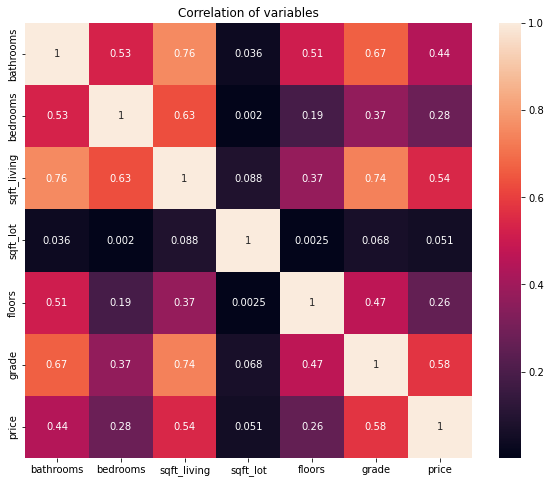

In [560]:
corr = data[['bathrooms', 'bedrooms', 'sqft_living', 'sqft_lot', 'floors', 'grade', 'price']]

plt.figure(figsize=(10,8))
plt.title('Correlation of variables')
sns.heatmap(corr.astype(float).corr(),vmax=1.0,  annot=True)
plt.show()

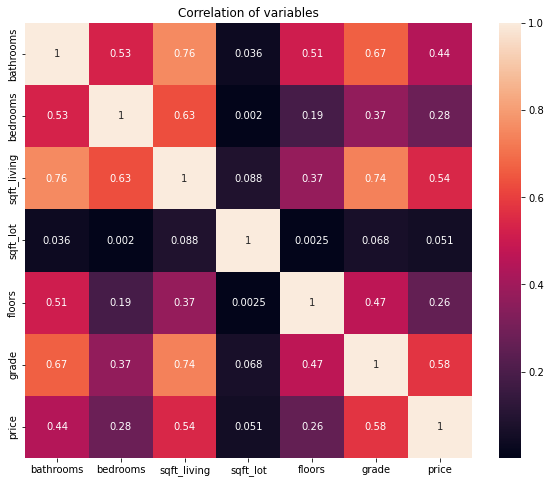

In [561]:
corr = data[['bathrooms', 'bedrooms', 'sqft_living', 'sqft_lot', 'floors', 'grade', 'price']]

plt.figure(figsize=(10,8))
plt.title('Correlation of variables')
sns.heatmap(corr.astype(float).corr(),vmax=1.0,  annot=True)
plt.show()

### Посмотрим на зависимости года постройки и цены

g:\practicum_ds\venv\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='yr_built', ylabel='Density'>

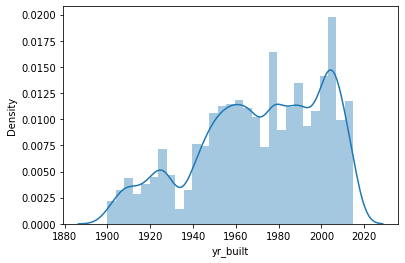

In [562]:
sns.distplot(data['yr_built'])

g:\practicum_ds\venv\lib\site-packages\seaborn\categorical.py:3717: UserWarning:

The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.

g:\practicum_ds\venv\lib\site-packages\seaborn\categorical.py:3723: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.



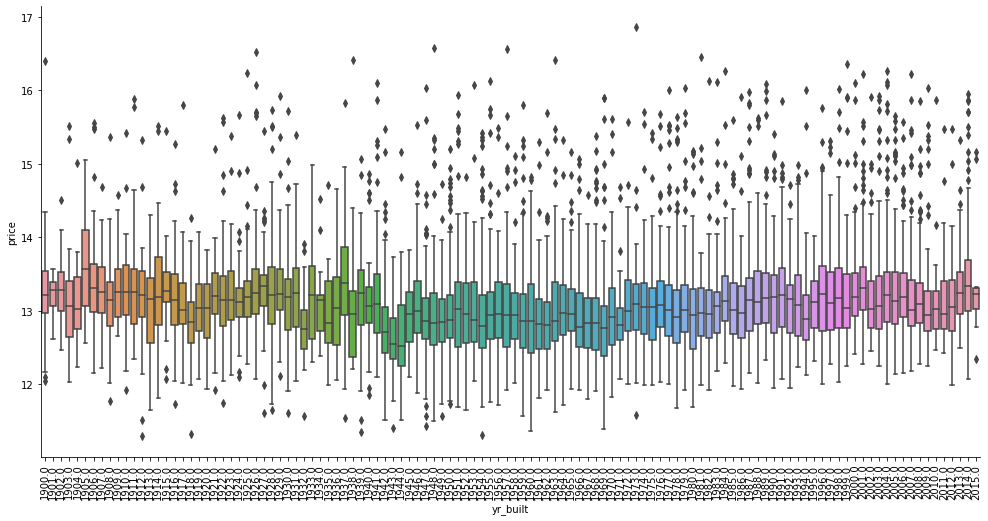

In [563]:
g = sns.factorplot(x="yr_built", y = "price", data=data[data['price'] < 1000000], 
                   size= 7, aspect = 2, kind="box" )
g.set_xticklabels(rotation=90)
plt.show()

In [564]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11679 entries, 1013 to 15128
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                11679 non-null  int64  
 1   date              11679 non-null  object 
 2   price             11448 non-null  float64
 3   bedrooms          11679 non-null  float64
 4   bathrooms         11679 non-null  float64
 5   sqft_living       11679 non-null  float64
 6   sqft_lot          11321 non-null  float64
 7   floors            11333 non-null  float64
 8   waterfront        11326 non-null  float64
 9   view              11327 non-null  float64
 10  condition         11320 non-null  float64
 11  grade             11326 non-null  float64
 12  sqft_above        11299 non-null  float64
 13  sqft_basement     11324 non-null  float64
 14  yr_built          11325 non-null  float64
 15  yr_renovated      11337 non-null  float64
 16  zipcode           11339 non-null  flo

### Д/З

Необходимо:
    
    1) Рассмотреть как выглядят данные до и после удаления выбросов, проанализировать как могут выбросы влиять на данные и совместные распределения
    2) В данных еще есть выбросы нужно их найти и избавиться от них (либо попробовать использовать)
    3) Придумать новые признаки (возраст здания и т.п. для дальнейшего обучения модели)
    4) Создать эти признаки для тестовой выборки на основе трейновой
    5) Обучить на этих данных модель сравнить с качеством бейзлайна
    6) Подобрать параметры и оценить насколько удалось улучшить качество за счет подбора параметров


In [109]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV

from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

from catboost import CatBoostRegressor

# немного экспериментальной магии от sklearn
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

In [65]:
data = pd.read_csv('train.csv')

CONTINUES_COLS = [
    "price",
    "sqft_living",
    "sqft_lot",
    "sqft_above",
    "sqft_living15",
    "sqft_lot15"
]

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15129 entries, 0 to 15128
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             15129 non-null  int64  
 1   date           15129 non-null  object 
 2   price          13763 non-null  float64
 3   bedrooms       13615 non-null  float64
 4   bathrooms      13616 non-null  float64
 5   sqft_living    13618 non-null  float64
 6   sqft_lot       13618 non-null  float64
 7   floors         14683 non-null  float64
 8   waterfront     14677 non-null  float64
 9   view           14695 non-null  float64
 10  condition      14656 non-null  float64
 11  grade          14666 non-null  float64
 12  sqft_above     13569 non-null  float64
 13  sqft_basement  14662 non-null  float64
 14  yr_built       14679 non-null  float64
 15  yr_renovated   14677 non-null  float64
 16  zipcode        14692 non-null  float64
 17  lat            14682 non-null  float64
 18  long  

#### Вспомним описание данных

date: Date house was sold (Дата продажи участка)
price: Price of the sold house (Цена продажи)
bedrooms: Number of Bedrooms (Число спален)
bathrooms: Number of bathrooms (Число ванных комнат)
sqft_living: Square footage of the living space (жилая площадь)
sqrt_lot: Square footage of the lot (общая площадь)
floors: Total floors in the house (кол-во этажей в доме)
waterfront: Whether the house is on a waterfront(1: yes, 0: no) (дом на набережной?)
view: special view? (вид из окна)
condition: Condition of the house (Состояние здания)
grade: unknown
sqft_above: Square footage of house apart from basement (Площадь здания без подвала)
sqft_basement: Square footage of the basement (Площадь подвала)
yr_built: Built year (Год постройки)
yr_renovated: Year when the house was renovated (Год реновации)
zipcode: zipcode of the house (Индекс здания)
lat: Latitude coordinate (Широта)
long Longitude coordinate (Долгота)
sqft_living15: Living room area in 2015(implies some renovations) (после реновации)
sqrt_lot15: Lot area in 2015(implies some renovations) (после реновации)

### Задание 1 и 2. Избавимся от выбросов и рассмотрим как выглядят данные до и после удаления выбросов, проанализировать как могут выбросы влиять на данные и совместные распределения

Посмотрим какие у нас еще остались возможные выбросы и аномалии

In [45]:
# вспомним что за данные у нас вообще есть
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,5561000190,20140502T000000,NaN,NaN,NaN,NaN,NaN,2.0,0.0,0.0,...,9.0,NaN,0.0,1977.0,0.0,98027.0,47.4635,-121.991,NaN,NaN
1,2207200675,20140502T000000,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,...,7.0,NaN,0.0,1956.0,0.0,98007.0,47.6022,-122.134,NaN,NaN
2,3390600010,20140502T000000,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,...,7.0,NaN,0.0,1955.0,0.0,98106.0,47.5334,-122.365,NaN,NaN
3,7525000080,20140502T000000,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,...,8.0,NaN,360.0,1980.0,0.0,98074.0,47.6267,-122.046,NaN,NaN
4,5072200040,20140502T000000,NaN,NaN,NaN,NaN,NaN,1.0,0.0,2.0,...,8.0,NaN,310.0,1957.0,0.0,98166.0,47.4419,-122.340,NaN,NaN


In [58]:
(data["sqft_basement"] / data["sqft_lot"])\
    .value_counts()\
    .reset_index()\
    .sort_values(by='index', ascending=False)\
    .rename({'index':'basement_area_increase', 0:'count'}, axis=1)\
    .query('basement_area_increase > 0.3')

,basement_area_increase,count
566,0.737179,1
4171,0.627208,1
351,0.600000,2
930,0.592075,1
792,0.574468,1
...,...,...
44,0.303030,4
2112,0.302778,1
512,0.302362,1
2552,0.301612,1


Есть ряд объектов, где площадь подвала больше общей площади объекта более чем на 30%. А есть объекты, где даже более чем на 60%. Выбросы? Аномалии? Я бы уточнил у поставщика данных. А пока не будем считать это каким-то выбросом и удалять их не будем.


In [47]:
(data["sqft_lot15"] / data["sqft_lot"])\
    .value_counts()\
    .reset_index()\
    .sort_values(by='index', ascending=False)\
    .rename({'index':'lot_area_increase', 0:'count'}, axis=1)\
    .query('lot_area_increase > 2')

,lot_area_increase,count
4903,80.321285,1
870,33.707865,1
9266,30.851064,1
2290,27.908352,1
8569,27.533765,1
...,...,...
8267,2.007160,1
4748,2.003183,1
3049,2.002662,1
1569,2.001601,1


Вот так реновация! В ряде случаев общая площадь увеличилась более чем в 2 раза, а где-то и почти в 34! Этот вопрос я бы также уточнил у поставщика. Пока не удаляем.

In [15]:
sns.pairplot(data[CONTINUES_COLS])

In [66]:
for col in CONTINUES_COLS:
    high_quantile = 0.95
    filtered_count = len(data[data[col] > data[col].quantile(high_quantile)])
    len_data = len(data)
    # отфильртуем все, что больше 0,95 квантиля
    print(f"В колонке {col} отфильтруем {filtered_count} значений, что составляет {filtered_count / len_data:.02f}% от датасета")
    data[col] = data[data[col] < data[col].quantile(high_quantile)][col]

В колонке price отфильтруем 689 значений, что составляет 0.05% от датасета
В колонке sqft_living отфильтруем 678 значений, что составляет 0.04% от датасета
В колонке sqft_lot отфильтруем 681 значений, что составляет 0.05% от датасета
В колонке sqft_above отфильтруем 675 значений, что составляет 0.04% от датасета
В колонке sqft_living15 отфильтруем 679 значений, что составляет 0.04% от датасета
В колонке sqft_lot15 отфильтруем 680 значений, что составляет 0.04% от датасета


In [17]:
sns.pairplot(data[CONTINUES_COLS])

### Выводы

После того как мы избавились от выбросов, наши данные приобрели "объем" при построении графиков совместных распределений и теперь можно более наглядно разглядеть или оценить зависимости.


### Задание 3, 4 и 5. Придумаем новые признаки (возраст здания и т.п. для дальнейшего обучения модели) и обучим модель из бейзлайна на полученном датасете

Для начала избавимся от пропусков

In [60]:
# посмотрим сколько у нас пропусков и где
data.isna().sum()

id                  0
date                0
price            2055
bedrooms         1514
bathrooms        1513
sqft_living      2193
sqft_lot         2192
floors            446
waterfront        452
view              434
condition         473
grade             463
sqft_above       2240
sqft_basement     467
yr_built          450
yr_renovated      452
zipcode           437
lat               447
long              447
sqft_living15    2203
sqft_lot15       2192
dtype: int64

У нас много пропусков в достаточно важных (на первый взгляд) метриках и в целевой метрике. Заполнять пропуски в целевой метрике имхо не самая удачная идея т.к. модель на этих данных будет учиться, а заполняем мы с довольно высоким риском (а скорее всего и долей) ошибки. Поэтому удалим пропуски в целевой метрике и посмотрим что останется.

In [67]:
data = data.dropna(subset=['price'])
data.isna().sum()

id                  0
date                0
price               0
bedrooms          395
bathrooms         391
sqft_living       913
sqft_lot         1027
floors            384
waterfront        381
view              381
condition         412
grade             394
sqft_above        984
sqft_basement     407
yr_built          379
yr_renovated      394
zipcode           380
lat               382
long              387
sqft_living15     965
sqft_lot15       1008
dtype: int64

Поля ID и DATE для дальнейшего обучения модели бесполезны - удалим их.
Также мы не сможем восстановить пропуски в координатах (поля long и lat), а они нам будут нужны в дальнейшем для обучения - поэтому удалим записи с пропусками в этих значениях.
Также не забываем проверять сколько данных будет удалено :) В нашем случае около 700 записей, что ок.

In [68]:
data = data.drop(['id', 'date'], axis=1)
data = data.dropna(subset=['long', 'lat'])

Посмотрим сколько пропусков осталось

In [69]:
data.isna().sum()

price              0
bedrooms         369
bathrooms        368
sqft_living      865
sqft_lot         960
floors           361
waterfront       356
view             362
condition        393
grade            374
sqft_above       925
sqft_basement    384
yr_built         349
yr_renovated     360
zipcode          353
lat                0
long               0
sqft_living15    908
sqft_lot15       948
dtype: int64

Заполним пропуски с помощью случайного леса с дефолтными параметрами

In [70]:
impute_model = CatBoostRegressor(thread_count=-1, random_state=25)
# ограничим количество итераций до 3 (чтобы на моем компе это выполнялось за разумное время :D, но чутка ухудшив качество дефолтно - 10)
# и заполнять будем от поля с наибольшим количеством пропусков к меньшему
it_imputer = IterativeImputer(impute_model, max_iter=3, imputation_order='descending')
data_after_imputer = it_imputer.fit_transform(data)

Learning rate set to 0.060103
0:	learn: 9037.2507044	total: 6.54ms	remaining: 6.54s
1:	learn: 8815.3950818	total: 12.2ms	remaining: 6.09s
2:	learn: 8621.5654428	total: 18.1ms	remaining: 6.03s
3:	learn: 8423.3304208	total: 24.5ms	remaining: 6.1s
4:	learn: 8252.8886747	total: 30.4ms	remaining: 6.05s
5:	learn: 8088.6406533	total: 36.7ms	remaining: 6.08s
6:	learn: 7941.5017733	total: 43.8ms	remaining: 6.21s
7:	learn: 7811.2549488	total: 49.7ms	remaining: 6.17s
8:	learn: 7692.8513339	total: 55.2ms	remaining: 6.08s
9:	learn: 7583.5548030	total: 60.4ms	remaining: 5.98s
10:	learn: 7486.5747158	total: 65.4ms	remaining: 5.88s
11:	learn: 7396.7513213	total: 70ms	remaining: 5.76s
12:	learn: 7311.4926522	total: 74.2ms	remaining: 5.63s
13:	learn: 7230.0159113	total: 78.8ms	remaining: 5.55s
14:	learn: 7156.7376811	total: 83.6ms	remaining: 5.49s
15:	learn: 7097.4688763	total: 88.3ms	remaining: 5.43s
16:	learn: 7040.5854623	total: 93.4ms	remaining: 5.4s
17:	learn: 6982.3107154	total: 98.3ms	remaining: 

G:\practicum_ds\venv\lib\site-packages\sklearn\impute\_iterative.py:699: ConvergenceWarning:

[IterativeImputer] Early stopping criterion not reached.



Отлично, теперь преобразуем восстановленные данные обратно в DataFrame и проверим, остались ли пропуски

In [71]:
data_after_imputer = pd.DataFrame(data_after_imputer, index=data.index, columns=data.columns)
data_after_imputer.isna().sum()

price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

От пропусков избавились, теперь добавим новые признаки

Кластеризуем объекты по координатам
Посмотрим как сейчас располагаются наши объекты

In [92]:
x_axis = data_after_imputer['long']
y_axis = data_after_imputer['lat']

fig = px.scatter(
    x=x_axis,
    y=y_axis,
    title='Расположение объектов по координатам'
    )

fig.update_xaxes(
    title='Долгота'
)
fig.update_yaxes(
    title='Широта'
)

fig.show()

Видим несколько явных кластеров, некоторые явно очень отдаленные объекты и большие кучи данных) Попробуем это разобрать по кластерам с помощью KMeans.
Для начала определим оптимальное количество кластеров для KMeans elbow методом.

In [93]:
kmean = KMeans()
visualiser = KElbowVisualizer(kmean, k=(2, 30))
visualiser.fit(data_after_imputer[['long', 'lat']])
visualiser.show()

G:\practicum_ds\venv\lib\site-packages\yellowbrick\base.py:246: UserWarning:

Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.



<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [94]:
visualiser.elbow_value_

8

Оптимально разделить выборку по координатам на 8 кластеров. Сделаем это и посмотрим что получится.

In [95]:
kmean_classifier = make_pipeline(StandardScaler(), KMeans(n_clusters=8, random_state=25))
pred = kmean_classifier.fit_predict(data_after_imputer[['long', 'lat']])

fig = px.scatter(
    x=x_axis,
    y=y_axis,
    color=pred,
    title='Расположение объектов по координатам после классификации с помощью KMeans'
    )

fig.update_xaxes(
    title='Долгота'
)
fig.update_yaxes(
    title='Широта'
)

fig.show()

Также посмотрим как данная классификация влияет на целевой признак и посмотрим, действительно ли там есть разница между классами

In [96]:
fig = px.box(
    x=pred,
    y=data_after_imputer['price'],
    title='Боксы цен по классам из KMeans')

fig.update_xaxes(
    title='Классы, полученные с помощью KMeans'
)

fig.update_yaxes(
    title='Цены'
)

fig.show()

Медианы цен почти во всех классах довольно сильно отличаются, есть вопросы к 1 и 3 классу, они выглядят довольно похожими. Но пока оставим как есть.
Приаттачим полученные классы к датасету и разобъем его на обучающую и тестовую выборки.

In [99]:
# присоединяем классы к датасету
data_after_imputer['geo_class'] = pred
# отделяем фичи от таргета
features = data_after_imputer.drop('price', axis=1)
target = data_after_imputer['price']
# разделяем выборки
X, X_test, y, y_test = train_test_split(features, target, test_size=.25, random_state=25)

Повторим шаги из бейзлайна

In [100]:
lr = make_pipeline(StandardScaler(), LinearRegression())
lr.fit(X, y)
print(r2_score(y_test, lr.predict(X_test)))

0.7183968344923584


In [115]:
feat_importances = pd.Series(lr[1].coef_, index=X.columns).sort_values(ascending=False)
fig = px.bar(feat_importances, title='Наиболее значимые признаки для линейной регрессии')

fig.update_layout(
    showlegend=False
)

fig.update_xaxes(
    title='Признак'
)

fig.update_yaxes(
    title='Коэфициент важности'
)

fig.show()

Ого! После очистки от выбросов и введения одного нового признака модель дает R2 = 0.71, при дефолтном бейслайне R2 = 0.11.
Как ни странно, но общая площадь, количество спален и ванных комнат линейной регрессии вообще не важно. Что логично, она же не человек :)
Попробуем модель CatBoostRegressor для решения этой задачи и подберем для нее параметры.

In [110]:
cbr = CatBoostRegressor(thread_count=-1, random_state=25)

params = dict(
    depth=[3, 5, 6, 8, 10],
    nan_mode=['Min', 'Max'],
    n_estimators=[100, 500, 1000, 1500, 2000]
)

cbr.randomized_search(params, X, y, cv=3, n_iter=10)

0:	learn: 548974.5409417	test: 554751.9797600	best: 554751.9797600 (0)	total: 11.5ms	remaining: 17.2s
1:	learn: 534630.2250701	test: 540500.2834484	best: 540500.2834484 (1)	total: 13.5ms	remaining: 10.1s
2:	learn: 520462.4830484	test: 526361.4703068	best: 526361.4703068 (2)	total: 15.3ms	remaining: 7.64s
3:	learn: 506636.3912389	test: 512461.0653847	best: 512461.0653847 (3)	total: 17.1ms	remaining: 6.41s
4:	learn: 493771.7726744	test: 499561.6539344	best: 499561.6539344 (4)	total: 19.4ms	remaining: 5.8s
5:	learn: 481341.7001135	test: 487202.6296714	best: 487202.6296714 (5)	total: 21.5ms	remaining: 5.36s
6:	learn: 468989.2849827	test: 474735.7734308	best: 474735.7734308 (6)	total: 23.8ms	remaining: 5.07s
7:	learn: 456773.4325637	test: 462499.8013925	best: 462499.8013925 (7)	total: 25.8ms	remaining: 4.82s
8:	learn: 445652.7798765	test: 451418.2903536	best: 451418.2903536 (8)	total: 28.3ms	remaining: 4.68s
9:	learn: 434818.0912215	test: 440393.8695608	best: 440393.8695608 (9)	total: 30.3m

{'params': {'depth': 8, 'iterations': 2000, 'nan_mode': 'Min'},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               45,
               46,
      

In [114]:
print(r2_score(y_test, cbr.predict(X_test)))

0.895289749533165


Целевая метрика улучшилась еще на 18 пунктов. Catboost знает свое дело :)

In [116]:
feat_importances = pd.Series(cbr.feature_importances_, index=X.columns).sort_values(ascending=False)

fig = px.bar(feat_importances, title='Наиболее значимые признаки для CatBoostRegressor')

fig.update_layout(
    showlegend=False
)

fig.update_xaxes(
    title='Признак'
)

fig.update_yaxes(
    title='Значение'
)

fig.show()

Наш целевой признак где-то по-середине, что тоже не плохо :)

Теперь отберем самые важные признаки для модели CBR и попробуем обучиться только на них. Посмотрим как это влияет на метрику.
Отберем 6 самых важных признаков.

In [120]:
best_features = feat_importances.nlargest(6).index
X_best_features = X[best_features]
X_test_best_features = X_test[best_features]

In [121]:
cbr = CatBoostRegressor(thread_count=-1, random_state=25)

params = dict(
    depth=[3, 5, 6, 8, 10],
    nan_mode=['Min', 'Max'],
    n_estimators=[100, 500, 1000, 1500, 2000]
)

cbr.randomized_search(params, X_best_features, y, cv=3, n_iter=10)

0:	learn: 548853.9783802	test: 554645.5162451	best: 554645.5162451 (0)	total: 2.66ms	remaining: 3.98s
1:	learn: 534045.7853102	test: 539900.4536897	best: 539900.4536897 (1)	total: 4.63ms	remaining: 3.47s
2:	learn: 519709.7270980	test: 525269.4407696	best: 525269.4407696 (2)	total: 6.98ms	remaining: 3.48s
3:	learn: 505859.4911334	test: 511254.2636746	best: 511254.2636746 (3)	total: 9ms	remaining: 3.36s
4:	learn: 492675.1758585	test: 498127.7087005	best: 498127.7087005 (4)	total: 10.9ms	remaining: 3.27s
5:	learn: 479492.6294993	test: 484875.5397833	best: 484875.5397833 (5)	total: 12.8ms	remaining: 3.18s
6:	learn: 467346.3648403	test: 472729.5485266	best: 472729.5485266 (6)	total: 14.6ms	remaining: 3.11s
7:	learn: 455333.6049679	test: 460629.2787980	best: 460629.2787980 (7)	total: 16ms	remaining: 2.99s
8:	learn: 443454.5498595	test: 448700.1636614	best: 448700.1636614 (8)	total: 17.4ms	remaining: 2.89s
9:	learn: 432293.9052749	test: 437484.7028291	best: 437484.7028291 (9)	total: 18.7ms	re

{'params': {'depth': 10, 'iterations': 1000, 'nan_mode': 'Min'},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               45,
               46,
     

Из-за меньшего количества фич, обучение проходит гораздо быстрее. Сейчас посмотрим на качество.

In [130]:
print(r2_score(y_test, cbr.predict(X_test_best_features)))

0.8679894345245863


В нашем случае качество ухудшилось на 3 пункта после выделения важных признаков.
Но попробуем все таки добиться аналогичного качества модели, при сокращении вычислительных мощностей для обучения путем отброса самых незначительных признаков.
Отбросим 4 самых незначительных признака. И оценим модель.

In [131]:
features_without_worst = feat_importances[:len(feat_importances)-4].index
X_without_worst = X[features_without_worst]
X_test_without_worst = X_test[features_without_worst]

cbr = CatBoostRegressor(thread_count=-1, random_state=25)

params = dict(
    depth=[3, 5, 6, 8, 10],
    nan_mode=['Min', 'Max'],
    n_estimators=[100, 500, 1000, 1500, 2000]
)

cbr.randomized_search(params, X_without_worst, y, cv=3, n_iter=10)

0:	learn: 548398.7192610	test: 554175.3351652	best: 554175.3351652 (0)	total: 2.19ms	remaining: 3.29s
1:	learn: 534086.3213038	test: 539847.4806305	best: 539847.4806305 (1)	total: 4.2ms	remaining: 3.14s
2:	learn: 519771.5477296	test: 525385.4673360	best: 525385.4673360 (2)	total: 6.2ms	remaining: 3.09s
3:	learn: 506199.9914822	test: 511771.9214310	best: 511771.9214310 (3)	total: 8.11ms	remaining: 3.03s
4:	learn: 492759.3479351	test: 498305.6979943	best: 498305.6979943 (4)	total: 9.69ms	remaining: 2.9s
5:	learn: 479709.4743415	test: 485220.7560398	best: 485220.7560398 (5)	total: 11.4ms	remaining: 2.85s
6:	learn: 467396.1436667	test: 472828.4496354	best: 472828.4496354 (6)	total: 13.2ms	remaining: 2.81s
7:	learn: 455409.2055473	test: 460845.7989550	best: 460845.7989550 (7)	total: 14.9ms	remaining: 2.78s
8:	learn: 443847.7708560	test: 449057.0438419	best: 449057.0438419 (8)	total: 16.7ms	remaining: 2.77s
9:	learn: 433021.9500213	test: 438115.1645667	best: 438115.1645667 (9)	total: 18.4ms	

{'params': {'depth': 8, 'iterations': 2000, 'nan_mode': 'Min'},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               45,
               46,
      

In [132]:
print(r2_score(y_test, cbr.predict(X_test_without_worst)))

0.8910018606209302


Чутка сэкономили вычислительные мощности, а также для этой модели можно не собирать целых 4 признака, а это может избавить всю систему в целом от нескольких процессов по сбору этих признаков в принципе, и как следствие меньше нужно объемов для хранения данных, меньше дебагов, работы и головных болей :)